In [1]:
import os
os.chdir('..')
os.getcwd()

'/Users/signapoop/Desktop/fyp-graph-clustering'

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

import urllib
import os
import numpy as np
import pickle
import pandas as pd

In [3]:
data_dir = '/Users/signapoop/Desktop/data/yux/tops_all.csv'

In [4]:
df = pd.read_csv(data_dir)

In [5]:
# shuffle the dataset
from sklearn.utils import shuffle
df = shuffle(df)

In [6]:
df = df.reset_index(drop=False)

In [7]:
df.head(5)

,index,description,page_url,brand,image_url,price,z0,z1,x0,x1,...,x56,x57,x58,x59,x60,x61,x62,x63,x64,x65
0,5527,Polo Shirt Regular Fit,https://www2.hm.com/en_us/productpage.06209280...,HM,http://lp2.hm.com/hmgoepprod?set=source[/fc/45...,14.99,1.283253,0.400544,0.002159,0.000043,...,0.008806,0.003484,0.007261,0.008197,0.004121,0.007336,0.001716,0.172364,0.014891,0.812745
1,3579,Blend Ostrich T-Shirt,https://us.asos.com/blend/blend-ostrich-t-shir...,Asos,https://images.asos-media.com/products/blend-o...,24.00,1.885544,-0.825790,0.011631,0.003261,...,0.000238,0.024333,0.002642,0.002623,0.001306,0.002126,0.001176,0.022238,0.004318,0.973444
2,3234,Asos 4505 Muscle T-Shirt With Quick Dry In Bur...,https://us.asos.com/asos-4505/asos-4505-muscle...,Asos,https://images.asos-media.com/products/asos-45...,16.00,1.755855,-0.169952,0.150891,0.374489,...,0.001869,0.018142,0.007178,0.014922,0.019121,0.004107,0.000681,0.000397,0.010171,0.989432
3,58,Asos Design Polo Shirt With All Over Bandana P...,https://us.asos.com/asos-design/asos-design-po...,Asos,https://images.asos-media.com/products/asos-de...,26.00,1.610860,-0.420608,0.123399,0.007426,...,0.001164,0.106487,0.046714,0.054156,0.020925,0.066428,0.001037,0.032547,0.003073,0.964380
4,7390,Pink Aztec Print Short Sleeve Revere Shirt,https://us.riverisland.com/p/pink-aztec-print-...,River Island,https://riverisland.scene7.com/is/image/RiverI...,50.00,1.047360,0.756138,0.022967,0.047082,...,0.000136,0.417160,0.353104,0.071863,0.049692,0.010078,0.108898,0.004396,0.000090,0.995514


In [8]:
features_df = df.iloc[:,-66:]

In [9]:
X = features_df.values

In [10]:
X.shape

(8393, 66)

In [11]:
n_train = 7000
X_train = X[:n_train]
X_test = X[n_train:]

In [12]:
from core.DimReduction import DimReduction

In [13]:
dim_red = DimReduction(n_components=2)

In [14]:
X_emb = dim_red.fit_transform(X_train, 'tsne')

In [15]:
from socket import timeout
from urllib.error import HTTPError, URLError
    
def getImageFromUrl(url):
    try:
        response = urllib.request.urlopen(url, timeout=10)
    except (HTTPError, URLError) as error:
        return None
    except timeout:
        return None
    else:
        #print('Access successful.')
        image = urllib.request.urlopen(url)
        return plt.imread(image, 'jpg')

def imscatter(X, images, ax=None, zoom=1):
    if ax is None:
        ax = plt.gca()
    
    for i in range(X.shape[0]):
        im = OffsetImage(images[i], zoom=zoom)
        ab = AnnotationBbox(im, (X[i,0], X[i,1]), xycoords='data', frameon=False)
        ax.add_artist(ab)
    ax.update_datalim(np.column_stack([X[:,0], X[:,1]]))
    ax.autoscale()

In [16]:
n_plot = 1000
X_plot = np.zeros((n_plot, 2))
i = 0
images = []
while len(images) < n_plot:
    img = getImageFromUrl(df.loc[i]['image_url'])
    if img is not None:
        X_plot[len(images)] = X_emb[i]
        images.append(img)
        if len(images)%100 == 0: print(len(images))
    i += 1

100
200
300
400
500
600
700
800
900
1000


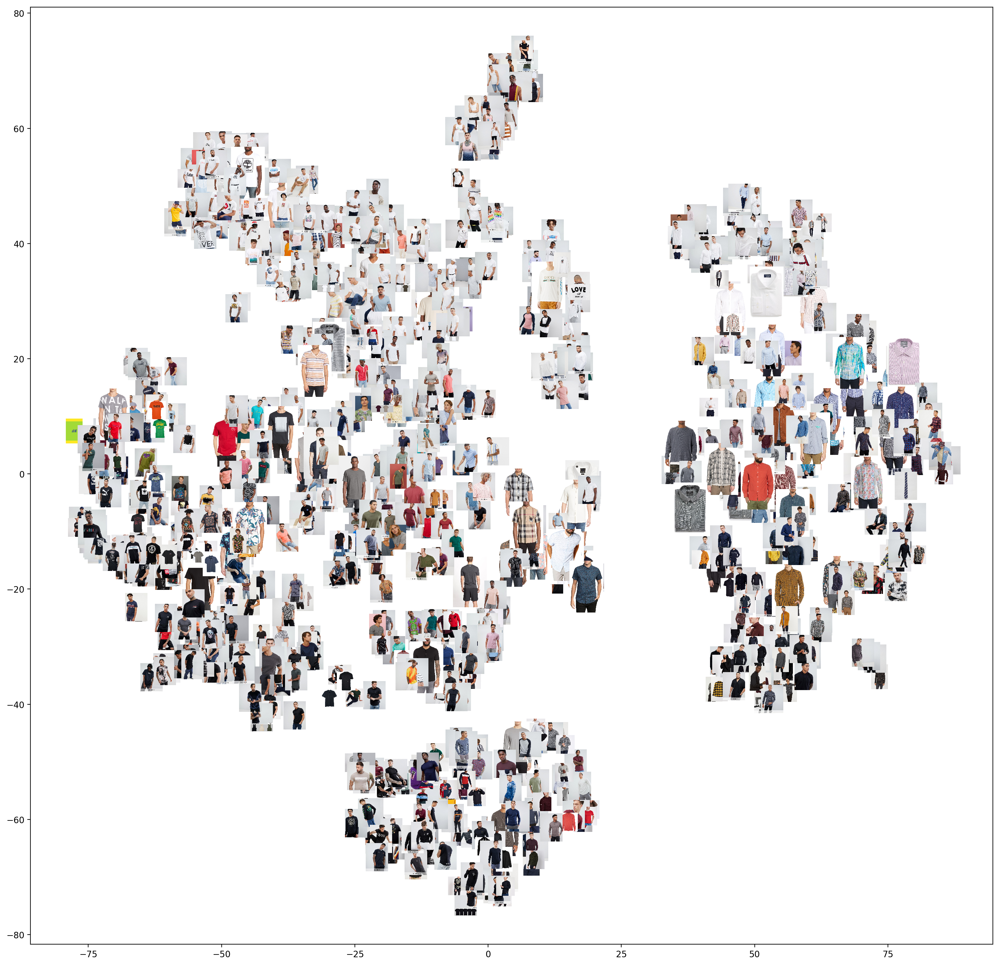

In [17]:
f, ax = plt.subplots(1, 1, sharex='col', sharey='row', figsize=(20,20), dpi=200)
imscatter(X_plot, images, zoom=0.05, ax=ax)
plt.show()

In [18]:
## Test set

In [19]:
X_emb_test = dim_red.fit_transform(X_test, 'tsne')

In [20]:
n_plot = 500
test_X_plot = np.zeros((n_plot, 2))
i = 0
test_images = []
while len(test_images) < n_plot:
    img = getImageFromUrl(df.loc[i+n_train]['image_url'])
    if img is not None:
        test_X_plot[len(test_images)] = X_emb_test[i]
        test_images.append(img)
        if len(test_images)%100 == 0: print(len(test_images))
    i += 1

100
200
300
400
500


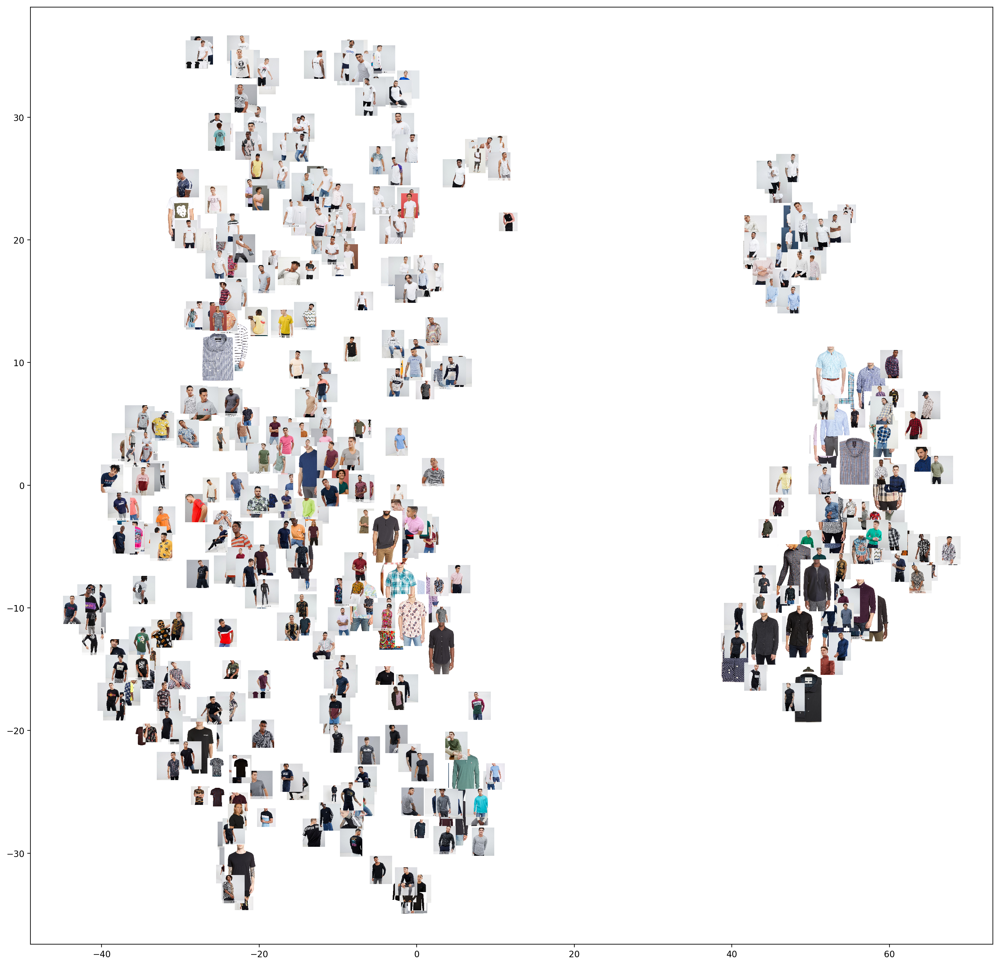

In [21]:
f, ax = plt.subplots(1, 1, sharex='col', sharey='row', figsize=(20,20), dpi=200)
imscatter(test_X_plot, test_images, zoom=0.05, ax=ax)
plt.show()

## Save data

In [26]:
print(X_train.shape)
inputs = X_train
labels = []
with open('yux_train_tsne_shuffle.pkl', 'wb') as f:
    pickle.dump([inputs, labels, X_emb], f)

(7000, 66)


In [27]:
print(X_test.shape)
inputs = X_test
labels = []
with open('yux_test_tsne_shuffle.pkl', 'wb') as f:
    pickle.dump([inputs, labels, X_emb_test], f)

(1393, 66)


In [25]:
df.to_csv('tops_shuffled.csv', index=False)